#Health Detection Model🌱🥀

#Import the Dataset

In [2]:
import gdown
import shutil
url = "https://drive.google.com/uc?export=download&id=1gkV6nL5VMABz6A4uBKDXbC8QhNtb_N3o"
output = 'dataset_new.zip'
gdown.download(url,output, quiet =False)
shutil.unpack_archive('dataset_new.zip','data_new/')

Downloading...
From: https://drive.google.com/uc?export=download&id=1gkV6nL5VMABz6A4uBKDXbC8QhNtb_N3o
To: /content/dataset_new.zip
100%|██████████| 102M/102M [00:01<00:00, 96.9MB/s]


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the dataset directory
dataset_path = "/content/data_new"

# Create an empty list to store image data and labels
images = []
labels = []

# Loop through each subdirectory in the dataset (assuming subdirectories are named with health status labels)
for label_name in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label_name)
    for img_name in os.listdir(label_path):
        img_path = os.path.join(label_path, img_name)
        image = cv2.imread(img_path)  # Read the image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        image = cv2.resize(image, (224, 224))  # Resize the image (assuming 224x224 input size for CNN)
        images.append(image)
        labels.append(label_name)

# Convert the lists to NumPy arrays for further processing
images = np.array(images)
labels = np.array(labels)


#Feature Extraction

In [5]:
from tensorflow.keras.applications import VGG16

# Load the VGG16 model (excluding the classification layers)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Extract features from the images using the VGG16 model
features = base_model.predict(images)


4/4 [==============================] - 70s 16s/step


# Principal Component Analysis

In [6]:
from sklearn.decomposition import PCA

# Flatten the features to apply PCA
flatten_features = features.reshape(features.shape[0], -1)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # You can adjust the number of components as needed
reduced_features = pca.fit_transform(flatten_features)


In [7]:
from sklearn.decomposition import PCA

# Flatten the features to apply PCA
flatten_features = features.reshape(features.shape[0], -1)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # You can adjust the number of components as needed
reduced_features = pca.fit_transform(flatten_features)


# KMeans Clustering

In [8]:
from sklearn.cluster import KMeans

# Determine the number of clusters (assuming you have some prior knowledge about the number of health statuses)
num_clusters = 3

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(reduced_features)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


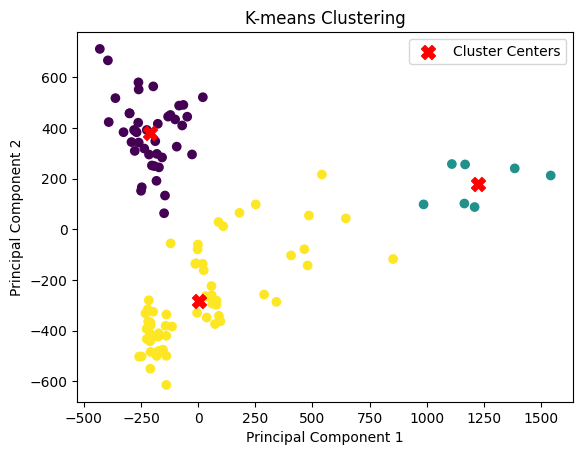

In [9]:
# Visualize the clusters (for the first two principal components)
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=clusters, cmap='viridis')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=100, c='red', marker='X', label='Cluster Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clustering')
plt.legend()
plt.show()

#Labeling the Clusters

In [10]:
cluster_labels_mapping = {
    0: "Medium Healthy",
    1: "Healthy",
    2: "Unhealthy"
}

In [11]:
assigned_labels = [cluster_labels_mapping[cluster] for cluster in clusters]

In [12]:
for i in range(len(images)):
    print(f"Image: {i + 1}, Cluster: {clusters[i]}, Assigned Label: {assigned_labels[i]}")

Image: 1, Cluster: 2, Assigned Label: Unhealthy
Image: 2, Cluster: 2, Assigned Label: Unhealthy
Image: 3, Cluster: 1, Assigned Label: Healthy
Image: 4, Cluster: 0, Assigned Label: Medium Healthy
Image: 5, Cluster: 2, Assigned Label: Unhealthy
Image: 6, Cluster: 2, Assigned Label: Unhealthy
Image: 7, Cluster: 2, Assigned Label: Unhealthy
Image: 8, Cluster: 2, Assigned Label: Unhealthy
Image: 9, Cluster: 2, Assigned Label: Unhealthy
Image: 10, Cluster: 2, Assigned Label: Unhealthy
Image: 11, Cluster: 0, Assigned Label: Medium Healthy
Image: 12, Cluster: 2, Assigned Label: Unhealthy
Image: 13, Cluster: 2, Assigned Label: Unhealthy
Image: 14, Cluster: 0, Assigned Label: Medium Healthy
Image: 15, Cluster: 0, Assigned Label: Medium Healthy
Image: 16, Cluster: 2, Assigned Label: Unhealthy
Image: 17, Cluster: 0, Assigned Label: Medium Healthy
Image: 18, Cluster: 2, Assigned Label: Unhealthy
Image: 19, Cluster: 2, Assigned Label: Unhealthy
Image: 20, Cluster: 1, Assigned Label: Healthy
Image: 2

In [13]:
# Get the unique cluster labels and their counts
unique_clusters, cluster_counts = np.unique(clusters, return_counts=True)

# Display the total number of images in each cluster
for cluster_label, count in zip(unique_clusters, cluster_counts):
    print(f"Cluster: {cluster_label}, Total Images: {count}")

Cluster: 0, Total Images: 42
Cluster: 1, Total Images: 7
Cluster: 2, Total Images: 61


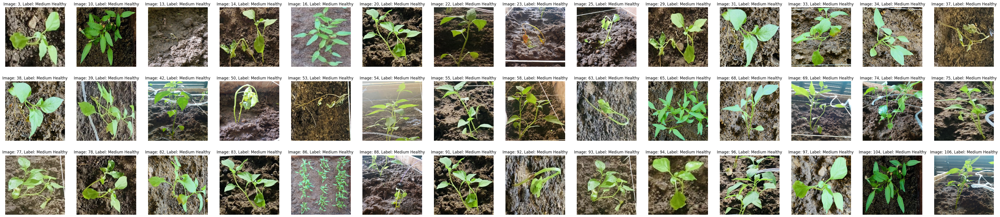

In [14]:
cluster_0_indices = np.where(clusters == 0)[0]

num_images = len(cluster_0_indices)
num_rows = min(3, num_images)  # Limit to a maximum of 3 rows for better visualization
num_cols = (num_images + num_rows - 1) // num_rows

plt.figure(figsize=(4 * num_cols, 4 * num_rows))
for i, image_index in enumerate(cluster_0_indices):
    image = images[image_index]
    assigned_label = assigned_labels[image_index]

    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(image)
    plt.title(f"Image: {image_index}, Label: {assigned_label}")
    plt.axis('off')

plt.show()


In [ ]:
cluster_1_indices = np.where(clusters == 1)[0]

num_images = len(cluster_1_indices)
num_rows = min(3, num_images)  # Limit to a maximum of 3 rows for better visualization
num_cols = (num_images + num_rows - 1) // num_rows

plt.figure(figsize=(4 * num_cols, 4 * num_rows))
for i, image_index in enumerate(cluster_1_indices):
    image = images[image_index]
    assigned_label = assigned_labels[image_index]

    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(image)
    plt.title(f"Image: {image_index}, Label: {assigned_label}")
    plt.axis('off')

plt.show()

In [ ]:
cluster_2_indices = np.where(clusters == 2)[0]

num_images = len(cluster_2_indices)
num_rows = min(3, num_images)  # Limit to a maximum of 3 rows for better visualization
num_cols = (num_images + num_rows - 1) // num_rows

plt.figure(figsize=(4 * num_cols, 4 * num_rows))
for i, image_index in enumerate(cluster_2_indices):
    image = images[image_index]
    assigned_label = assigned_labels[image_index]

    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(image)
    plt.title(f"Image: {image_index}, Label: {assigned_label}")
    plt.axis('off')

plt.show()


#Prediction

1/1 [==============================] - 1s 653ms/step


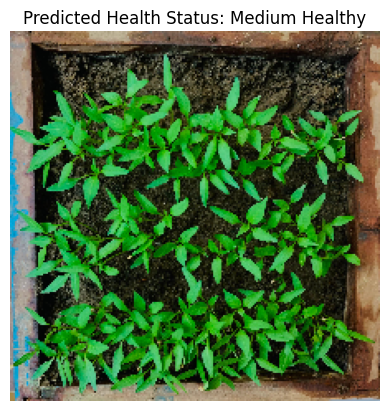

In [17]:
import cv2
import numpy as np
from tensorflow.keras.applications import VGG16
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming you have already trained the K-means model and loaded it as 'kmeans'
# kmeans = ...

# Preprocess the input image
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return cv2.resize(image, (224, 224)) / 255.0

input_image_path = "/content/drive/MyDrive/FYP Project/Health Detection/Check/1/check(1).jpeg"
input_image = preprocess_image(input_image_path)

# Feature extraction using VGG16
input_features = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)).predict(np.expand_dims(input_image, axis=0))

# Load the trained PCA model or determine the correct number of components
# pca = ...
# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # You can adjust the number of components as needed
reduced_features = pca.fit_transform(flatten_features)


# Transform the input features using PCA
reduced_input_features = pca.transform(input_features.reshape(-1, np.prod(input_features.shape[1:])))

# Predict the cluster and assign health status label
cluster_labels_mapping = {0: "UnHealthy", 1: "Healthy", 2: "Medium Healthy"}
predicted_health_status = cluster_labels_mapping[kmeans.predict(reduced_input_features)[0]]

# Show the input image
plt.imshow(input_image)
plt.title(f"Predicted Health Status: {predicted_health_status}")
plt.axis('off')
plt.show()


1/1 [==============================] - 1s 658ms/step


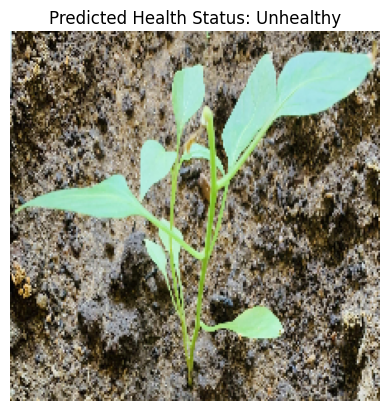

In [18]:
import cv2
import numpy as np
from tensorflow.keras.applications import VGG16
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming you have already trained the K-means model and loaded it as 'kmeans'
# kmeans = ...

# Preprocess the input image
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return cv2.resize(image, (224, 224)) / 255.0

input_image_path = "/content/drive/MyDrive/FYP Project/Health Detection/Check/2/check(9).JPG"
input_image = preprocess_image(input_image_path)

# Feature extraction using VGG16
input_features = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)).predict(np.expand_dims(input_image, axis=0))

# Load the trained PCA model or determine the correct number of components
# pca = ...
# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # You can adjust the number of components as needed
reduced_features = pca.fit_transform(flatten_features)


# Transform the input features using PCA
reduced_input_features = pca.transform(input_features.reshape(-1, np.prod(input_features.shape[1:])))

# Predict the cluster and assign health status label
cluster_labels_mapping = {0: "Healthy", 1: "Medium Healthy", 2: "Unhealthy"}
predicted_health_status = cluster_labels_mapping[kmeans.predict(reduced_input_features)[0]]

# Show the input image
plt.imshow(input_image)
plt.title(f"Predicted Health Status: {predicted_health_status}")
plt.axis('off')
plt.show()


1/1 [==============================] - 1s 670ms/step


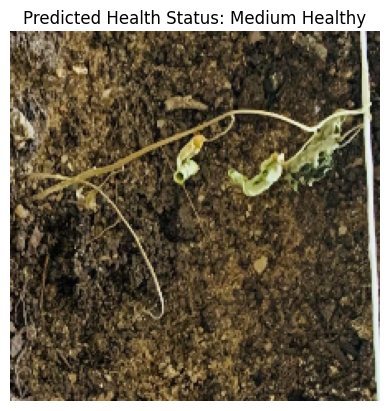

In [19]:
import cv2
import numpy as np
from tensorflow.keras.applications import VGG16
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming you have already trained the K-means model and loaded it as 'kmeans'
# kmeans = ...

# Preprocess the input image
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return cv2.resize(image, (224, 224)) / 255.0

input_image_path = "/content/drive/MyDrive/FYP Project/Health Detection/Check/3/check(7).JPG"
input_image = preprocess_image(input_image_path)

# Feature extraction using VGG16
input_features = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3)).predict(np.expand_dims(input_image, axis=0))

# Load the trained PCA model or determine the correct number of components
# pca = ...
# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)  # You can adjust the number of components as needed
reduced_features = pca.fit_transform(flatten_features)


# Transform the input features using PCA
reduced_input_features = pca.transform(input_features.reshape(-1, np.prod(input_features.shape[1:])))

# Predict the cluster and assign health status label
cluster_labels_mapping = {0: "Healthy", 1: "Unhealthy", 2: "Medium Healthy"}
predicted_health_status = cluster_labels_mapping[kmeans.predict(reduced_input_features)[0]]

# Show the input image
plt.imshow(input_image)
plt.title(f"Predicted Health Status: {predicted_health_status}")
plt.axis('off')
plt.show()
